In [8]:
import math
import random

import matplotlib.pyplot as plt
import pydiffvg
import torch
import skimage
import skimage.io
import ttools.modules

In [2]:
#     parser.add_argument("target", help="target image path")
#     parser.add_argument("--num_paths", type=int, default=512)
#     parser.add_argument("--max_width", type=float, default=2.0)
#     parser.add_argument("--use_lpips_loss", dest='use_lpips_loss', action='store_true')
#     parser.add_argument("--num_iter", type=int, default=500)
#     parser.add_argument("--use_blob", dest='use_blob', action='store_true')

In [3]:
torch.cuda.is_available()

True

In [4]:
pydiffvg.set_use_gpu(torch.cuda.is_available())

In [5]:
pydiffvg.get_device()

device(type='cuda')

In [6]:
fp = '../../data/sandbox/figure_1.jpeg'

In [7]:
target = torch.tensor(skimage.io.imread(fp)).to(torch.float32) / 255.0
target.shape

torch.Size([508, 360, 3])

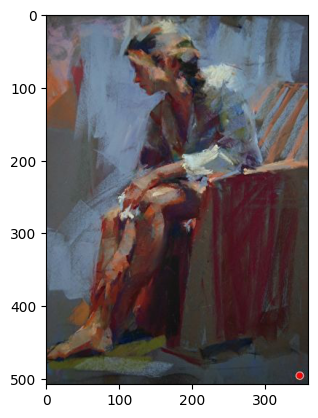

In [9]:
plt.imshow(target)

In [10]:
gamma = 1.
target = target.pow(gamma)
target = target.to(pydiffvg.get_device())
target = target.unsqueeze(0)
target = target.permute(0, 3, 1, 2) # NHWC -> NCHW
target.shape

torch.Size([1, 3, 508, 360])

In [28]:
canvas_width, canvas_height = target.shape[3], target.shape[2]
num_paths = 512
max_width = 2.
use_blob = False
num_iter = 500

In [12]:
shapes = []
shape_groups = []
if use_blob:
    for i in range(num_paths):
        num_segments = random.randint(3, 5)
        num_control_points = torch.zeros(num_segments, dtype=torch.int32) + 2
        points = []
        p0 = (random.random(), random.random())
        points.append(p0)
        for j in range(num_segments):
            radius = 0.05
            p1 = (p0[0] + radius * (random.random() - 0.5), p0[1] + radius * (random.random() - 0.5))
            p2 = (p1[0] + radius * (random.random() - 0.5), p1[1] + radius * (random.random() - 0.5))
            p3 = (p2[0] + radius * (random.random() - 0.5), p2[1] + radius * (random.random() - 0.5))
            points.append(p1)
            points.append(p2)
            if j < num_segments - 1:
                points.append(p3)
                p0 = p3
        points = torch.tensor(points)
        points[:, 0] *= canvas_width
        points[:, 1] *= canvas_height
        path = pydiffvg.Path(num_control_points = num_control_points,
                             points = points,
                             stroke_width = torch.tensor(1.0),
                             is_closed = True)
        shapes.append(path)
        path_group = pydiffvg.ShapeGroup(shape_ids = torch.tensor([len(shapes) - 1]),
                                         fill_color = torch.tensor([random.random(),
                                                                    random.random(),
                                                                    random.random(),
                                                                    random.random()]))
        shape_groups.append(path_group)
else:
    for i in range(num_paths):
        num_segments = random.randint(1, 3)
        num_control_points = torch.zeros(num_segments, dtype = torch.int32) + 2
        points = []
        p0 = (random.random(), random.random())
        points.append(p0)
        for j in range(num_segments):
            radius = 0.05
            p1 = (p0[0] + radius * (random.random() - 0.5), p0[1] + radius * (random.random() - 0.5))
            p2 = (p1[0] + radius * (random.random() - 0.5), p1[1] + radius * (random.random() - 0.5))
            p3 = (p2[0] + radius * (random.random() - 0.5), p2[1] + radius * (random.random() - 0.5))
            points.append(p1)
            points.append(p2)
            points.append(p3)
            p0 = p3
        points = torch.tensor(points)
        points[:, 0] *= canvas_width
        points[:, 1] *= canvas_height
        #points = torch.rand(3 * num_segments + 1, 2) * min(canvas_width, canvas_height)
        path = pydiffvg.Path(num_control_points = num_control_points,
                             points = points,
                             stroke_width = torch.tensor(1.0),
                             is_closed = False)
        shapes.append(path)
        path_group = pydiffvg.ShapeGroup(shape_ids = torch.tensor([len(shapes) - 1]),
                                         fill_color = None,
                                         stroke_color = torch.tensor([random.random(),
                                                                      random.random(),
                                                                      random.random(),
                                                                      random.random()]))
        shape_groups.append(path_group)

In [13]:
scene_args = pydiffvg.RenderFunction.serialize_scene(
    canvas_width, canvas_height, shapes, shape_groups)

render = pydiffvg.RenderFunction.apply
img = render(canvas_width, # width
             canvas_height, # height
             2,   # num_samples_x
             2,   # num_samples_y
             0,   # seed
             None,
             *scene_args)

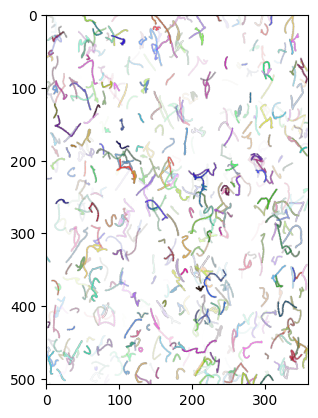

In [17]:
plt.imshow(img.cpu().detach())

In [18]:
shapes[0].points

tensor([[188.1819, 118.4981],
        [184.0891, 128.9104],
        [190.8844, 124.1385],
        [183.7161, 132.1988],
        [184.7114, 137.1747],
        [191.3846, 142.0520],
        [188.5880, 148.0749],
        [182.5540, 139.6406],
        [176.5138, 131.8951],
        [180.6505, 125.5035]])

In [19]:
shapes[0].stroke_width

tensor(1.)

In [24]:
shape_groups[0].stroke_color

tensor([0.4400, 0.2456, 0.8534, 0.5043])

In [25]:
points_vars = []
stroke_width_vars = []
color_vars = []
for path in shapes:
    path.points.requires_grad = True
    points_vars.append(path.points)
if not use_blob:
    for path in shapes:
        path.stroke_width.requires_grad = True
        stroke_width_vars.append(path.stroke_width)
if use_blob:
    for group in shape_groups:
        group.fill_color.requires_grad = True
        color_vars.append(group.fill_color)
else:
    for group in shape_groups:
        group.stroke_color.requires_grad = True
        color_vars.append(group.stroke_color)

In [27]:
# Optimizers
points_optim = torch.optim.Adam(points_vars, lr=1.0)
if len(stroke_width_vars) > 0:
    width_optim = torch.optim.Adam(stroke_width_vars, lr=0.1)
color_optim = torch.optim.Adam(color_vars, lr=0.01)

iteration: 0


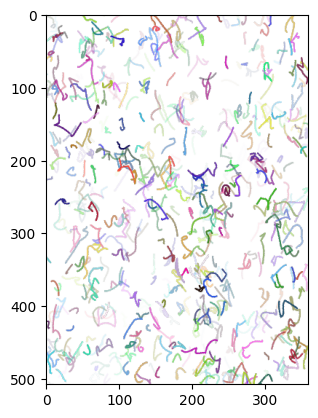

render loss: 0.42716240882873535
iteration: 1
render loss: 0.41475749015808105
iteration: 2
render loss: 0.40103694796562195
iteration: 3
render loss: 0.3866003155708313
iteration: 4
render loss: 0.3709527552127838
iteration: 5
render loss: 0.3543597459793091
iteration: 6
render loss: 0.3369622230529785
iteration: 7
render loss: 0.31879720091819763
iteration: 8
render loss: 0.3000258207321167
iteration: 9
render loss: 0.2812240421772003
iteration: 10


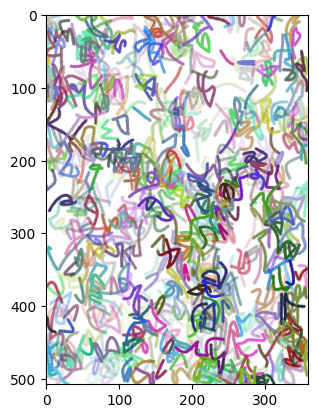

render loss: 0.2688450813293457
iteration: 11
render loss: 0.25669389963150024
iteration: 12
render loss: 0.24507732689380646
iteration: 13
render loss: 0.23325693607330322
iteration: 14
render loss: 0.22176826000213623
iteration: 15
render loss: 0.210682213306427
iteration: 16
render loss: 0.20019429922103882
iteration: 17
render loss: 0.18992117047309875
iteration: 18
render loss: 0.17988020181655884
iteration: 19
render loss: 0.17003822326660156
iteration: 20


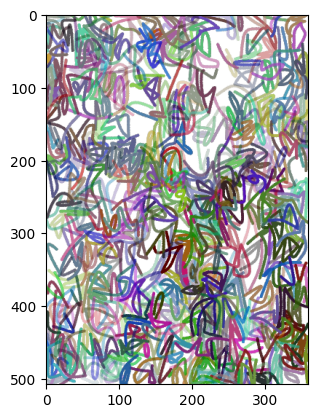

render loss: 0.1606697142124176
iteration: 21
render loss: 0.15172426402568817
iteration: 22
render loss: 0.14300258457660675
iteration: 23
render loss: 0.13481590151786804
iteration: 24
render loss: 0.12683948874473572
iteration: 25
render loss: 0.11913253366947174
iteration: 26
render loss: 0.11180797964334488
iteration: 27
render loss: 0.1052112877368927
iteration: 28
render loss: 0.09845994412899017
iteration: 29
render loss: 0.09247621148824692
iteration: 30


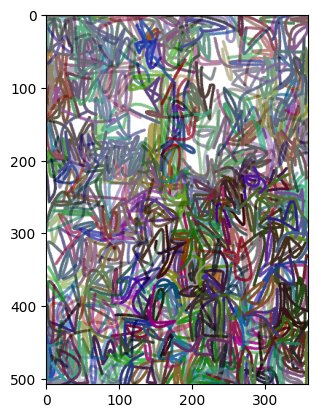

render loss: 0.08669359236955643
iteration: 31
render loss: 0.08135922253131866
iteration: 32
render loss: 0.0762968435883522
iteration: 33
render loss: 0.07162170857191086
iteration: 34
render loss: 0.06698941439390182
iteration: 35
render loss: 0.0629977434873581
iteration: 36
render loss: 0.05950013920664787
iteration: 37
render loss: 0.0559237040579319
iteration: 38
render loss: 0.052609868347644806
iteration: 39
render loss: 0.04948458820581436
iteration: 40


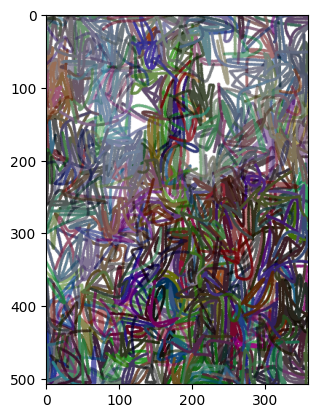

render loss: 0.04675854369997978
iteration: 41
render loss: 0.04392572119832039
iteration: 42
render loss: 0.04133572429418564
iteration: 43
render loss: 0.0389484167098999
iteration: 44
render loss: 0.037019211798906326
iteration: 45
render loss: 0.03511499613523483
iteration: 46
render loss: 0.033393461257219315
iteration: 47
render loss: 0.03192231431603432
iteration: 48
render loss: 0.030386922881007195
iteration: 49
render loss: 0.028848793357610703
iteration: 50


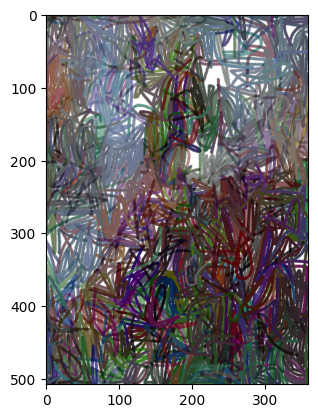

render loss: 0.027674643322825432
iteration: 51
render loss: 0.026416564360260963
iteration: 52
render loss: 0.025119176134467125
iteration: 53
render loss: 0.024025198072195053
iteration: 54
render loss: 0.02300548180937767
iteration: 55
render loss: 0.022167978808283806
iteration: 56
render loss: 0.021295147016644478
iteration: 57
render loss: 0.020363887771964073
iteration: 58
render loss: 0.01972363144159317
iteration: 59
render loss: 0.018969407305121422
iteration: 60


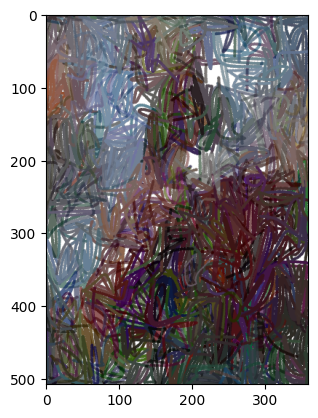

render loss: 0.018304698169231415
iteration: 61
render loss: 0.017680982127785683
iteration: 62
render loss: 0.017200548201799393
iteration: 63
render loss: 0.01668420061469078
iteration: 64
render loss: 0.016141528263688087
iteration: 65
render loss: 0.015610196627676487
iteration: 66
render loss: 0.015179826878011227
iteration: 67
render loss: 0.014824473299086094
iteration: 68
render loss: 0.01445804350078106
iteration: 69
render loss: 0.01415420975536108
iteration: 70


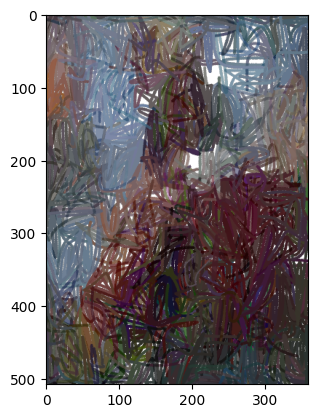

render loss: 0.013760779984295368
iteration: 71
render loss: 0.013506818562746048
iteration: 72
render loss: 0.013155613094568253
iteration: 73
render loss: 0.012835567817091942
iteration: 74
render loss: 0.012550918385386467
iteration: 75
render loss: 0.012271599844098091
iteration: 76
render loss: 0.012006619945168495
iteration: 77
render loss: 0.011826287023723125
iteration: 78
render loss: 0.01156020537018776
iteration: 79
render loss: 0.011320577934384346
iteration: 80


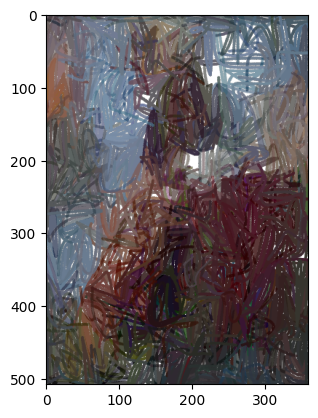

render loss: 0.011077233590185642
iteration: 81
render loss: 0.010873469524085522
iteration: 82
render loss: 0.01072643045336008
iteration: 83
render loss: 0.010624564252793789
iteration: 84
render loss: 0.010506260208785534
iteration: 85
render loss: 0.010345048271119595
iteration: 86
render loss: 0.01017531007528305
iteration: 87
render loss: 0.009998888708651066
iteration: 88
render loss: 0.009951520711183548
iteration: 89
render loss: 0.009813335724174976
iteration: 90


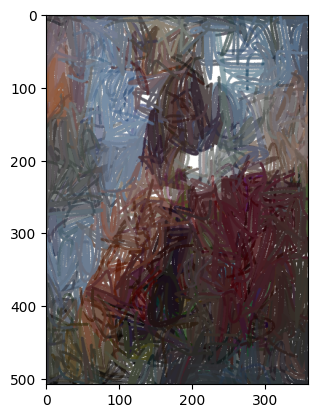

render loss: 0.009725147858262062
iteration: 91
render loss: 0.009618144482374191
iteration: 92
render loss: 0.009442637674510479
iteration: 93
render loss: 0.009362798184156418
iteration: 94
render loss: 0.009147075936198235
iteration: 95
render loss: 0.009113568812608719
iteration: 96
render loss: 0.009051653556525707
iteration: 97
render loss: 0.00895770639181137
iteration: 98
render loss: 0.008892069570720196
iteration: 99
render loss: 0.008792170323431492
iteration: 100


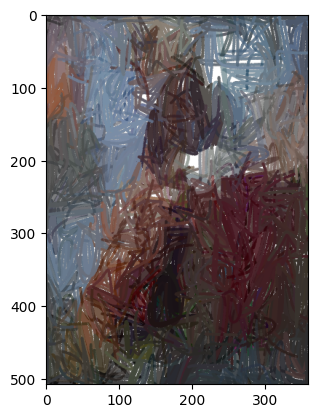

render loss: 0.008711687289178371
iteration: 101
render loss: 0.008586401119828224
iteration: 102
render loss: 0.00857763271778822
iteration: 103
render loss: 0.008491474203765392
iteration: 104
render loss: 0.00829978659749031
iteration: 105
render loss: 0.008305229246616364
iteration: 106
render loss: 0.008143090642988682
iteration: 107
render loss: 0.00810751412063837
iteration: 108
render loss: 0.008064668625593185
iteration: 109
render loss: 0.008038842119276524
iteration: 110


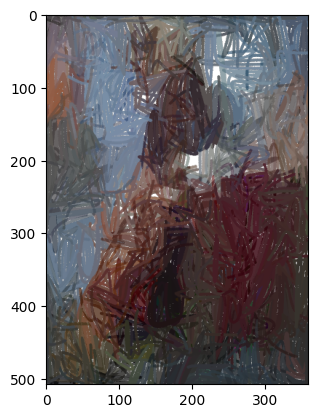

render loss: 0.007941142655909061
iteration: 111
render loss: 0.00788070447742939
iteration: 112
render loss: 0.00778711074963212
iteration: 113
render loss: 0.0077131022699177265
iteration: 114
render loss: 0.007750866934657097
iteration: 115
render loss: 0.007631183601915836
iteration: 116
render loss: 0.007564245257526636
iteration: 117
render loss: 0.007515304256230593
iteration: 118
render loss: 0.007505849003791809
iteration: 119
render loss: 0.007492173463106155
iteration: 120


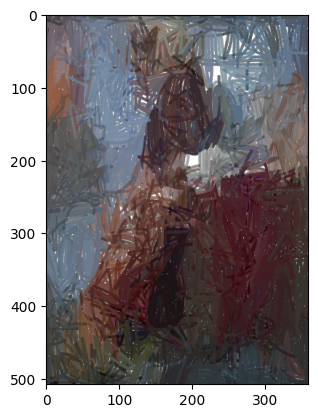

render loss: 0.007414805702865124
iteration: 121
render loss: 0.007349008694291115
iteration: 122
render loss: 0.007289843168109655
iteration: 123
render loss: 0.00722937798127532
iteration: 124
render loss: 0.007241259329020977
iteration: 125
render loss: 0.007199502550065517
iteration: 126
render loss: 0.007140215486288071
iteration: 127
render loss: 0.007086710538715124
iteration: 128
render loss: 0.007027586922049522
iteration: 129
render loss: 0.0070597101002931595
iteration: 130


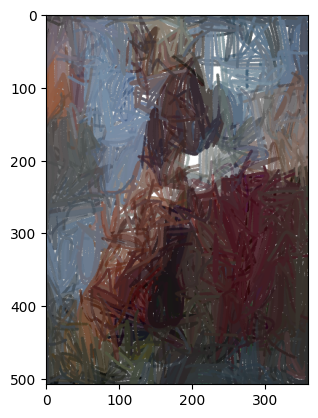

render loss: 0.007031647488474846
iteration: 131
render loss: 0.006995057221502066
iteration: 132
render loss: 0.006931622046977282
iteration: 133
render loss: 0.006866816896945238
iteration: 134
render loss: 0.006886423099786043
iteration: 135
render loss: 0.0068275160156190395
iteration: 136
render loss: 0.0067472318187355995
iteration: 137
render loss: 0.006760879885405302
iteration: 138
render loss: 0.006756009068340063
iteration: 139
render loss: 0.00672605074942112
iteration: 140


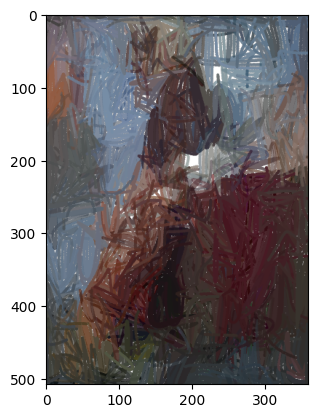

render loss: 0.006650807801634073
iteration: 141
render loss: 0.006631143856793642
iteration: 142
render loss: 0.006589055992662907
iteration: 143
render loss: 0.006636073812842369
iteration: 144
render loss: 0.006519912742078304
iteration: 145
render loss: 0.006523231975734234
iteration: 146
render loss: 0.0065033878199756145
iteration: 147
render loss: 0.00647299038246274
iteration: 148
render loss: 0.006440720520913601
iteration: 149
render loss: 0.006427575368434191
iteration: 150


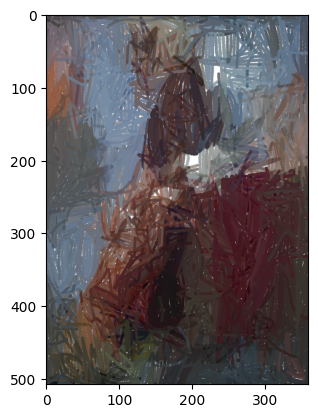

render loss: 0.006447284948080778
iteration: 151
render loss: 0.006401012651622295
iteration: 152
render loss: 0.006367919035255909
iteration: 153
render loss: 0.006364570464938879
iteration: 154
render loss: 0.006301739253103733
iteration: 155
render loss: 0.0063090999610722065
iteration: 156
render loss: 0.0063141570426523685
iteration: 157
render loss: 0.006271891295909882
iteration: 158
render loss: 0.00626887334510684
iteration: 159
render loss: 0.0062161581590771675
iteration: 160


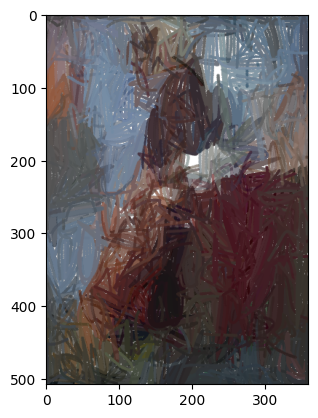

render loss: 0.0062051620334386826
iteration: 161
render loss: 0.0061714136973023415
iteration: 162
render loss: 0.0062036775052547455
iteration: 163
render loss: 0.006161924451589584
iteration: 164
render loss: 0.006127226632088423
iteration: 165
render loss: 0.006090876180678606
iteration: 166
render loss: 0.006136560812592506
iteration: 167
render loss: 0.0060911644250154495
iteration: 168
render loss: 0.006101164035499096
iteration: 169
render loss: 0.006026262417435646
iteration: 170


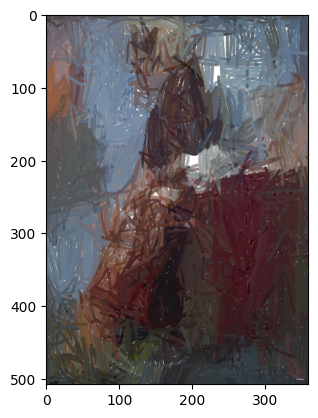

render loss: 0.006049283780157566
iteration: 171
render loss: 0.0060614971444010735
iteration: 172
render loss: 0.00601202342659235
iteration: 173
render loss: 0.005951214116066694
iteration: 174
render loss: 0.005942236166447401
iteration: 175
render loss: 0.005968607496470213
iteration: 176
render loss: 0.005946557968854904
iteration: 177
render loss: 0.005907346028834581
iteration: 178
render loss: 0.005855214782059193
iteration: 179
render loss: 0.005905942525714636
iteration: 180


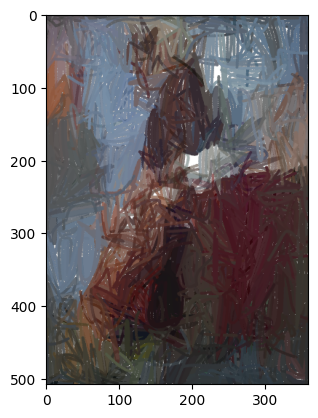

render loss: 0.005858686286956072
iteration: 181
render loss: 0.005861546844244003
iteration: 182
render loss: 0.005828166380524635
iteration: 183
render loss: 0.005822454113513231
iteration: 184
render loss: 0.005820336285978556
iteration: 185
render loss: 0.005777816288173199
iteration: 186
render loss: 0.00573922460898757
iteration: 187
render loss: 0.005779246333986521
iteration: 188
render loss: 0.005773249547928572
iteration: 189
render loss: 0.005712808109819889
iteration: 190


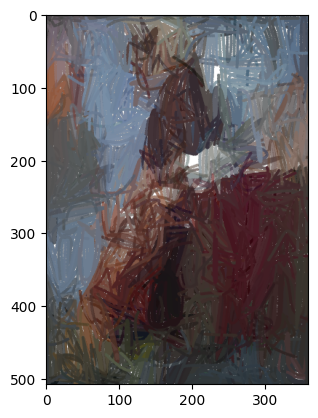

render loss: 0.005716261919587851
iteration: 191
render loss: 0.005706302355974913
iteration: 192
render loss: 0.005713916849344969
iteration: 193
render loss: 0.005663798190653324
iteration: 194
render loss: 0.00564280990511179
iteration: 195
render loss: 0.005659133195877075
iteration: 196
render loss: 0.005633033346384764
iteration: 197
render loss: 0.005627559032291174
iteration: 198
render loss: 0.005586411338299513
iteration: 199
render loss: 0.005625411402434111
iteration: 200


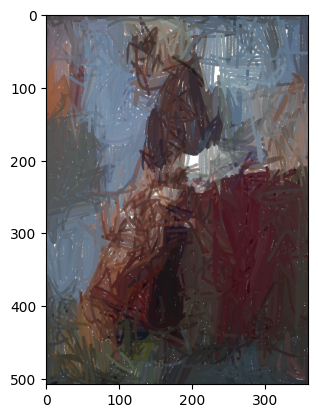

render loss: 0.005580191500484943
iteration: 201
render loss: 0.005579115357249975
iteration: 202
render loss: 0.005608905106782913
iteration: 203
render loss: 0.005565487314015627
iteration: 204
render loss: 0.0055594476871192455
iteration: 205
render loss: 0.005519958212971687
iteration: 206
render loss: 0.0055492655374109745
iteration: 207
render loss: 0.005540653597563505
iteration: 208
render loss: 0.005517587531358004
iteration: 209
render loss: 0.005507522262632847
iteration: 210


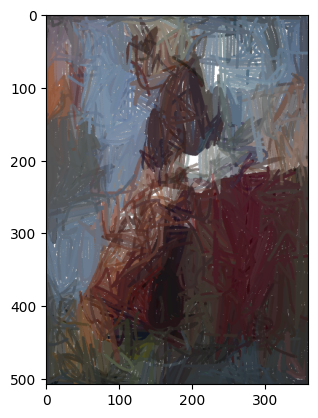

render loss: 0.005519764963537455
iteration: 211
render loss: 0.0055063883773982525
iteration: 212
render loss: 0.005484438501298428
iteration: 213
render loss: 0.00548672117292881
iteration: 214
render loss: 0.005473724100738764
iteration: 215
render loss: 0.0054805101826786995
iteration: 216
render loss: 0.005489673465490341
iteration: 217
render loss: 0.005413257982581854
iteration: 218
render loss: 0.005418173037469387
iteration: 219
render loss: 0.005449733231216669
iteration: 220


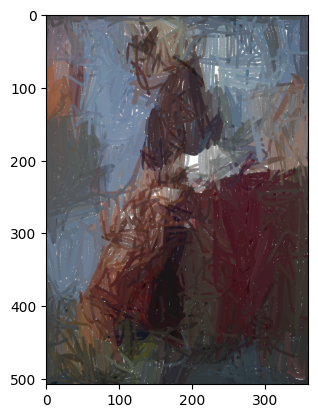

render loss: 0.005395197309553623
iteration: 221
render loss: 0.005370510276407003
iteration: 222
render loss: 0.005370027851313353
iteration: 223
render loss: 0.005342204123735428
iteration: 224
render loss: 0.0053650736808776855
iteration: 225
render loss: 0.005355854984372854
iteration: 226
render loss: 0.005361799616366625
iteration: 227
render loss: 0.005347797647118568
iteration: 228
render loss: 0.005306319333612919
iteration: 229
render loss: 0.005332885775715113
iteration: 230


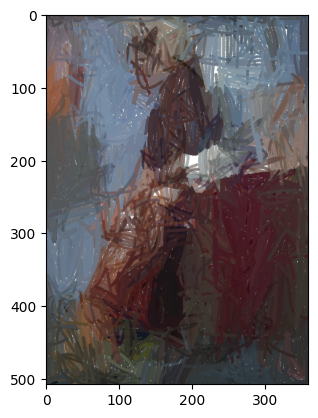

render loss: 0.005298777483403683
iteration: 231
render loss: 0.005268854554742575
iteration: 232
render loss: 0.005316113121807575
iteration: 233
render loss: 0.005292119458317757
iteration: 234
render loss: 0.005294543690979481
iteration: 235
render loss: 0.005292724817991257
iteration: 236
render loss: 0.00526009313762188
iteration: 237
render loss: 0.005247747525572777
iteration: 238
render loss: 0.00530219404026866
iteration: 239
render loss: 0.005234674550592899
iteration: 240


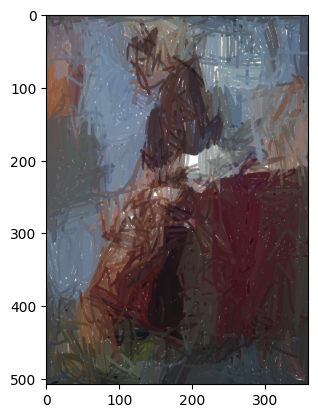

render loss: 0.005229154601693153
iteration: 241
render loss: 0.0052262889221310616
iteration: 242
render loss: 0.005226142704486847
iteration: 243
render loss: 0.005218634847551584
iteration: 244
render loss: 0.005204331129789352
iteration: 245
render loss: 0.005207296460866928
iteration: 246
render loss: 0.005185551475733519
iteration: 247
render loss: 0.0051742177456617355
iteration: 248
render loss: 0.005136958323419094
iteration: 249
render loss: 0.005196034908294678
iteration: 250


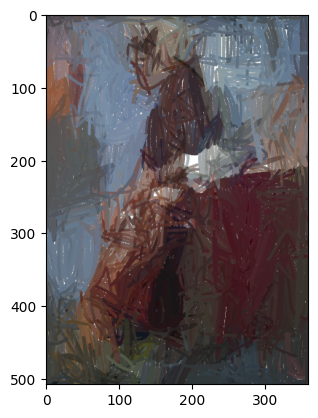

render loss: 0.005176008678972721
iteration: 251
render loss: 0.005129663273692131
iteration: 252
render loss: 0.00514950230717659
iteration: 253
render loss: 0.005159158259630203
iteration: 254
render loss: 0.005175502970814705
iteration: 255
render loss: 0.0051167793571949005
iteration: 256
render loss: 0.005121584516018629
iteration: 257
render loss: 0.005086302757263184
iteration: 258
render loss: 0.005137259140610695
iteration: 259
render loss: 0.005122109781950712
iteration: 260


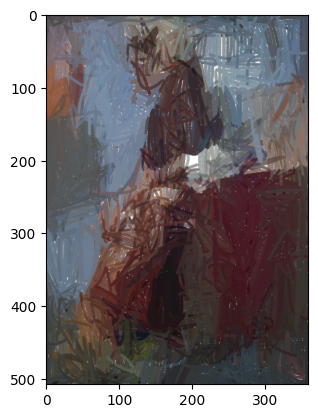

render loss: 0.005083780270069838
iteration: 261
render loss: 0.005068823229521513
iteration: 262
render loss: 0.00505025452002883
iteration: 263
render loss: 0.005081676412373781
iteration: 264
render loss: 0.005046049598604441
iteration: 265
render loss: 0.005084994249045849
iteration: 266
render loss: 0.005013725254684687
iteration: 267
render loss: 0.0050354269333183765
iteration: 268
render loss: 0.005049577448517084
iteration: 269
render loss: 0.005027549806982279
iteration: 270


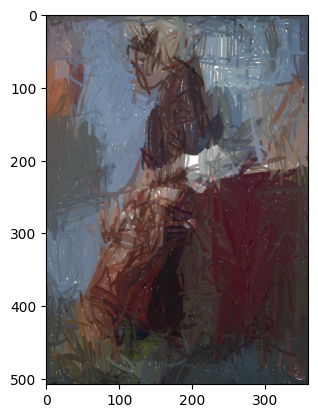

render loss: 0.005001161713153124
iteration: 271
render loss: 0.005017068237066269
iteration: 272
render loss: 0.005000802222639322
iteration: 273
render loss: 0.005004442296922207
iteration: 274
render loss: 0.005021111108362675
iteration: 275
render loss: 0.0049826581962406635
iteration: 276
render loss: 0.004943030886352062
iteration: 277
render loss: 0.0049567497335374355
iteration: 278
render loss: 0.004986254498362541
iteration: 279
render loss: 0.004961710888892412
iteration: 280


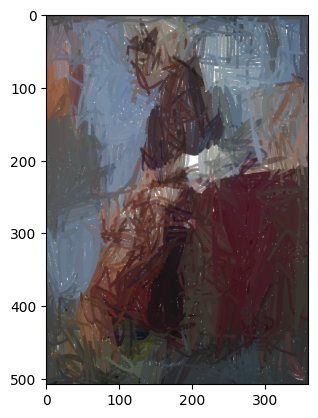

render loss: 0.004970591515302658
iteration: 281
render loss: 0.004932567942887545
iteration: 282
render loss: 0.004930591210722923
iteration: 283
render loss: 0.004953166004270315
iteration: 284
render loss: 0.00491573428735137
iteration: 285
render loss: 0.0048833321779966354
iteration: 286
render loss: 0.00493260333314538
iteration: 287
render loss: 0.004911910742521286
iteration: 288
render loss: 0.004944857209920883
iteration: 289
render loss: 0.00490571791306138
iteration: 290


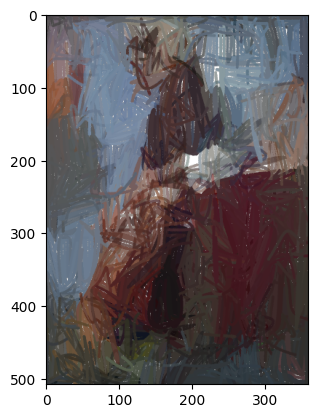

render loss: 0.004921069368720055
iteration: 291
render loss: 0.00489770295098424
iteration: 292
render loss: 0.0048897722736001015
iteration: 293
render loss: 0.004884654190391302
iteration: 294
render loss: 0.004880634602159262
iteration: 295
render loss: 0.004848543554544449
iteration: 296
render loss: 0.004896529950201511
iteration: 297
render loss: 0.004843651782721281
iteration: 298
render loss: 0.0048087784089148045
iteration: 299
render loss: 0.004819462541490793
iteration: 300


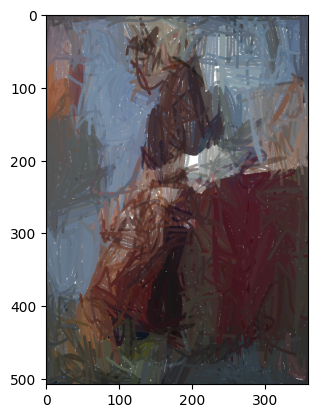

render loss: 0.00481186481192708
iteration: 301
render loss: 0.004797286354005337
iteration: 302
render loss: 0.004794900771230459
iteration: 303
render loss: 0.004813173785805702
iteration: 304
render loss: 0.004800005350261927
iteration: 305
render loss: 0.004769365768879652
iteration: 306
render loss: 0.004781727679073811
iteration: 307
render loss: 0.004763847216963768
iteration: 308
render loss: 0.004765369463711977
iteration: 309
render loss: 0.004770105704665184
iteration: 310


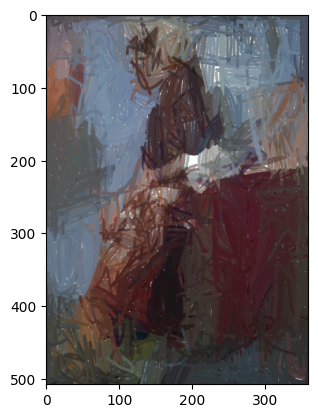

render loss: 0.004755363333970308
iteration: 311
render loss: 0.004708825144916773
iteration: 312
render loss: 0.004710572771728039
iteration: 313
render loss: 0.004716778639703989
iteration: 314
render loss: 0.004705582745373249
iteration: 315
render loss: 0.004720672033727169
iteration: 316
render loss: 0.004693988710641861
iteration: 317
render loss: 0.004662910010665655
iteration: 318
render loss: 0.004720100201666355
iteration: 319
render loss: 0.004706173669546843
iteration: 320


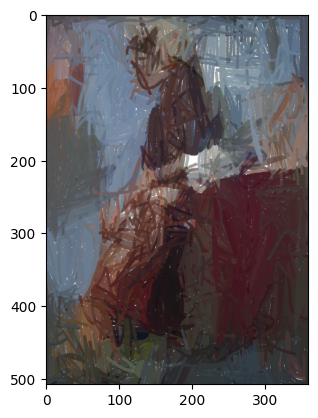

render loss: 0.004691027104854584
iteration: 321
render loss: 0.004688887856900692
iteration: 322
render loss: 0.004660297650843859
iteration: 323
render loss: 0.004651387222111225
iteration: 324
render loss: 0.0046617272309958935
iteration: 325
render loss: 0.004639641381800175
iteration: 326
render loss: 0.0046422542072832584
iteration: 327
render loss: 0.004640489351004362
iteration: 328
render loss: 0.004647448193281889
iteration: 329
render loss: 0.004604601766914129
iteration: 330


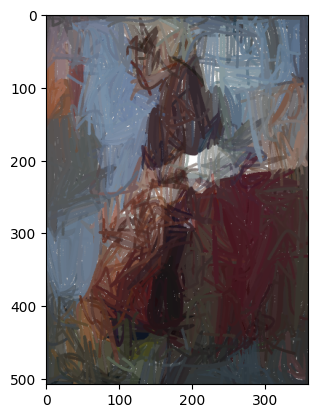

render loss: 0.004614832811057568
iteration: 331
render loss: 0.004579887725412846
iteration: 332
render loss: 0.004576968494802713
iteration: 333
render loss: 0.00461654644459486
iteration: 334
render loss: 0.004601244814693928
iteration: 335
render loss: 0.004583640024065971
iteration: 336
render loss: 0.004593529272824526
iteration: 337
render loss: 0.004635094199329615
iteration: 338
render loss: 0.004598656203597784
iteration: 339
render loss: 0.004576022271066904
iteration: 340


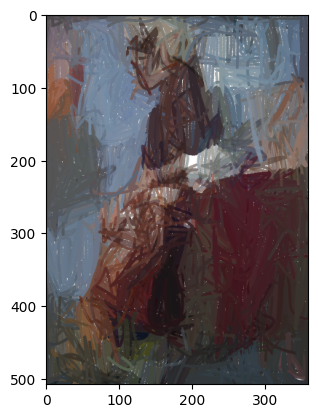

render loss: 0.004583191126585007
iteration: 341
render loss: 0.004575829021632671
iteration: 342
render loss: 0.0045825764536857605
iteration: 343
render loss: 0.004587665665894747
iteration: 344
render loss: 0.004551620688289404
iteration: 345
render loss: 0.004539807792752981
iteration: 346
render loss: 0.00453353114426136
iteration: 347
render loss: 0.004593243822455406
iteration: 348
render loss: 0.004567218478769064
iteration: 349
render loss: 0.004530003760010004
iteration: 350


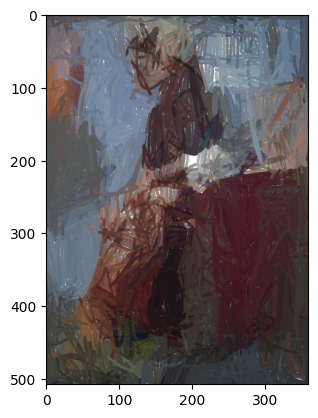

render loss: 0.004507087636739016
iteration: 351
render loss: 0.0045434050261974335
iteration: 352
render loss: 0.004518905654549599
iteration: 353
render loss: 0.004487053025513887
iteration: 354
render loss: 0.004494139458984137
iteration: 355
render loss: 0.004495806526392698
iteration: 356
render loss: 0.004489514976739883
iteration: 357
render loss: 0.004452875349670649
iteration: 358
render loss: 0.004451584070920944
iteration: 359
render loss: 0.004463565070182085
iteration: 360


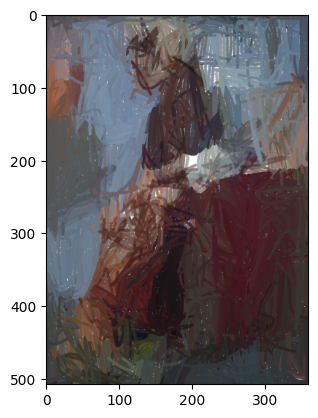

render loss: 0.0044604139402508736
iteration: 361
render loss: 0.004478883929550648
iteration: 362
render loss: 0.0044475821778178215
iteration: 363
render loss: 0.004472789354622364
iteration: 364
render loss: 0.004430737346410751
iteration: 365
render loss: 0.004435718059539795
iteration: 366
render loss: 0.00443759560585022
iteration: 367
render loss: 0.004392136819660664
iteration: 368
render loss: 0.004435316659510136
iteration: 369
render loss: 0.004427863750606775
iteration: 370


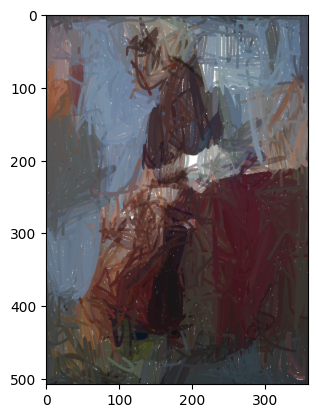

render loss: 0.004424443002790213
iteration: 371
render loss: 0.00442139757797122
iteration: 372
render loss: 0.004411026369780302
iteration: 373
render loss: 0.004458191338926554
iteration: 374
render loss: 0.004442918114364147
iteration: 375
render loss: 0.004408156964927912
iteration: 376
render loss: 0.00437910808250308
iteration: 377
render loss: 0.004374222364276648
iteration: 378
render loss: 0.004380775615572929
iteration: 379
render loss: 0.004385180305689573
iteration: 380


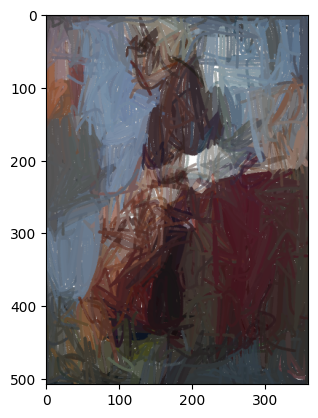

render loss: 0.004392185248434544
iteration: 381
render loss: 0.0043882341124117374
iteration: 382
render loss: 0.00438348762691021
iteration: 383
render loss: 0.004389538895338774
iteration: 384
render loss: 0.004377894103527069
iteration: 385
render loss: 0.004407851956784725
iteration: 386
render loss: 0.004381108097732067
iteration: 387
render loss: 0.004323864821344614
iteration: 388
render loss: 0.004330424126237631
iteration: 389
render loss: 0.004319270607084036
iteration: 390


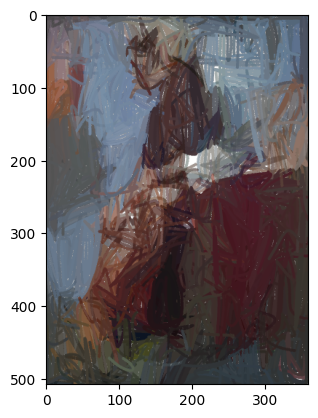

render loss: 0.00436146417632699
iteration: 391
render loss: 0.004369405563920736
iteration: 392
render loss: 0.004322907421737909
iteration: 393
render loss: 0.004344858694821596
iteration: 394
render loss: 0.004323508124798536
iteration: 395
render loss: 0.0042997184209525585
iteration: 396
render loss: 0.0043193502351641655
iteration: 397
render loss: 0.0042987121269106865
iteration: 398
render loss: 0.004273883067071438
iteration: 399
render loss: 0.004304562229663134
iteration: 400


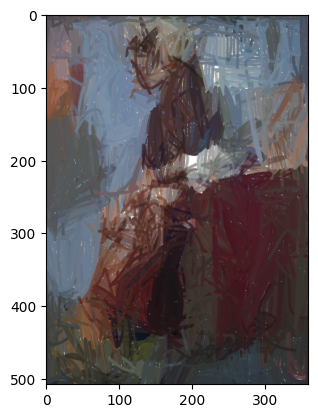

render loss: 0.004261591471731663
iteration: 401
render loss: 0.004306758288294077
iteration: 402
render loss: 0.004285652656108141
iteration: 403
render loss: 0.004273948259651661
iteration: 404
render loss: 0.004274940118193626
iteration: 405
render loss: 0.004293242935091257
iteration: 406
render loss: 0.004294352140277624
iteration: 407
render loss: 0.004283607471734285
iteration: 408
render loss: 0.0042593637481331825
iteration: 409
render loss: 0.004263012669980526
iteration: 410


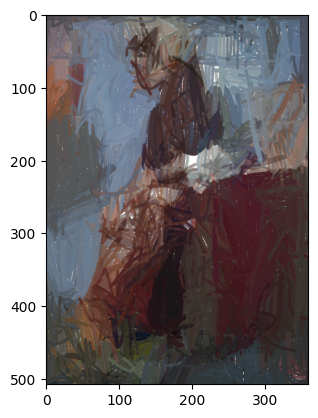

render loss: 0.004297098610550165
iteration: 411
render loss: 0.004251696169376373
iteration: 412
render loss: 0.004278965760022402
iteration: 413
render loss: 0.004235220607370138
iteration: 414
render loss: 0.004249353427439928
iteration: 415
render loss: 0.004238524939864874
iteration: 416
render loss: 0.0042630708776414394
iteration: 417
render loss: 0.004273563623428345
iteration: 418
render loss: 0.004249052610248327
iteration: 419
render loss: 0.004246821161359549
iteration: 420


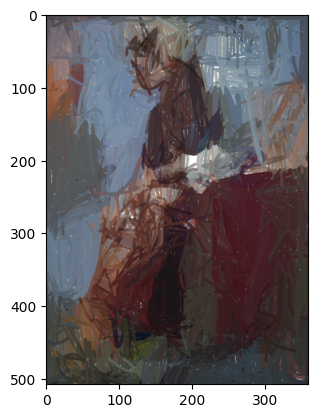

render loss: 0.004222610965371132
iteration: 421
render loss: 0.004213122185319662
iteration: 422
render loss: 0.004212840460240841
iteration: 423
render loss: 0.004212815314531326
iteration: 424
render loss: 0.004252991639077663
iteration: 425
render loss: 0.004211426712572575
iteration: 426
render loss: 0.004200910218060017
iteration: 427
render loss: 0.004227248951792717
iteration: 428
render loss: 0.004213717300444841
iteration: 429
render loss: 0.004209501668810844
iteration: 430


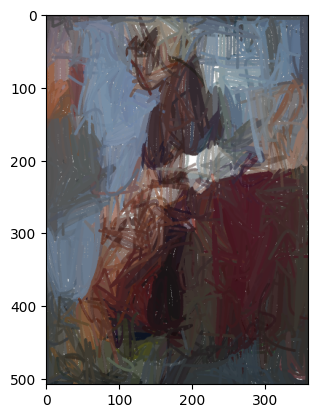

render loss: 0.004226467572152615
iteration: 431
render loss: 0.004220804199576378
iteration: 432
render loss: 0.0042240209877491
iteration: 433
render loss: 0.00420236075296998
iteration: 434
render loss: 0.004193298518657684
iteration: 435
render loss: 0.004199904389679432
iteration: 436
render loss: 0.0042380657978355885
iteration: 437
render loss: 0.004222742281854153
iteration: 438
render loss: 0.004261775873601437
iteration: 439
render loss: 0.004224942997097969
iteration: 440


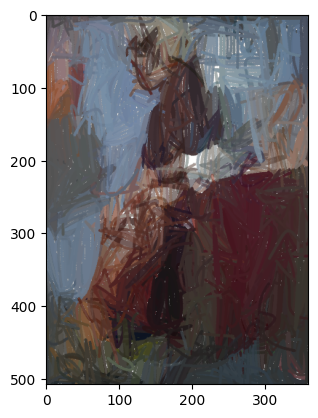

render loss: 0.004230115097016096
iteration: 441
render loss: 0.004204228520393372
iteration: 442
render loss: 0.004207255318760872
iteration: 443
render loss: 0.004208994563668966
iteration: 444
render loss: 0.004196465015411377
iteration: 445
render loss: 0.0041702925227582455
iteration: 446
render loss: 0.004179239273071289
iteration: 447
render loss: 0.004238073714077473
iteration: 448
render loss: 0.004189284984022379
iteration: 449
render loss: 0.0041827247478067875
iteration: 450


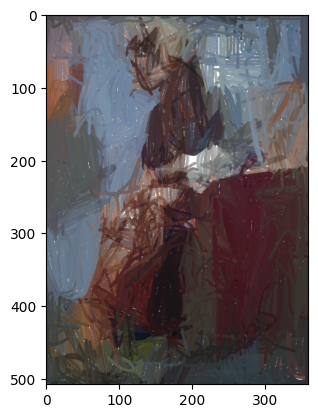

render loss: 0.004182975739240646
iteration: 451
render loss: 0.004151638131588697
iteration: 452
render loss: 0.004145878367125988
iteration: 453
render loss: 0.004142505116760731
iteration: 454
render loss: 0.004162854049354792
iteration: 455
render loss: 0.004133588168770075
iteration: 456
render loss: 0.004170602653175592
iteration: 457
render loss: 0.004142869263887405
iteration: 458
render loss: 0.004125949461013079
iteration: 459
render loss: 0.004118439741432667
iteration: 460


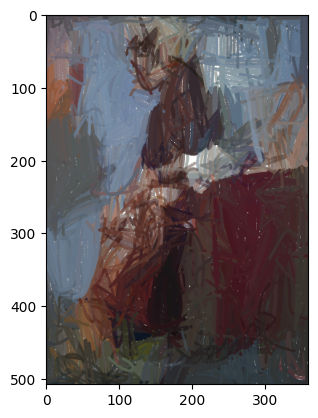

render loss: 0.004126845858991146
iteration: 461
render loss: 0.0041374871507287025
iteration: 462
render loss: 0.00415552593767643
iteration: 463
render loss: 0.004121316131204367
iteration: 464
render loss: 0.004124864935874939
iteration: 465
render loss: 0.004145336337387562
iteration: 466
render loss: 0.004135540686547756
iteration: 467
render loss: 0.0041269464418292046
iteration: 468
render loss: 0.004120078403502703
iteration: 469
render loss: 0.0041213310323655605
iteration: 470


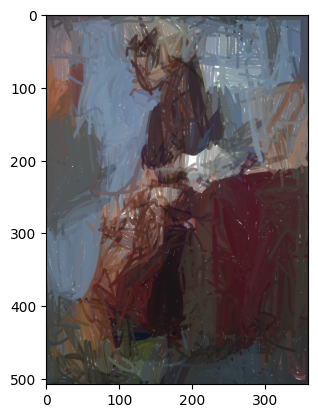

render loss: 0.004067608155310154
iteration: 471
render loss: 0.0041123609989881516
iteration: 472
render loss: 0.004096375312656164
iteration: 473
render loss: 0.004084690939635038
iteration: 474
render loss: 0.004085625987499952
iteration: 475
render loss: 0.004059512633830309
iteration: 476
render loss: 0.004079834558069706
iteration: 477
render loss: 0.004070976749062538
iteration: 478
render loss: 0.0040670596063137054
iteration: 479
render loss: 0.004077274817973375
iteration: 480


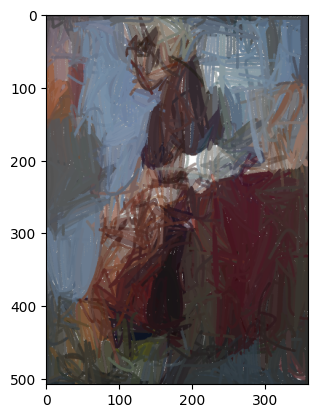

render loss: 0.00406812084838748
iteration: 481
render loss: 0.004062026739120483
iteration: 482
render loss: 0.004061274696141481
iteration: 483
render loss: 0.004036376718431711
iteration: 484
render loss: 0.004037950187921524
iteration: 485
render loss: 0.004047777969390154
iteration: 486
render loss: 0.0040193842723965645
iteration: 487
render loss: 0.004016776569187641
iteration: 488
render loss: 0.004011151846498251
iteration: 489
render loss: 0.004018969368189573
iteration: 490


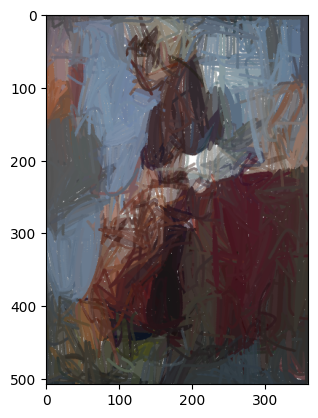

render loss: 0.00403685262426734
iteration: 491
render loss: 0.004000951535999775
iteration: 492
render loss: 0.0040003093890845776
iteration: 493
render loss: 0.003997791092842817
iteration: 494
render loss: 0.003951462917029858
iteration: 495
render loss: 0.003968085628002882
iteration: 496
render loss: 0.003991184290498495
iteration: 497
render loss: 0.003992355428636074
iteration: 498
render loss: 0.003986742813140154
iteration: 499
render loss: 0.004018029663711786


In [30]:
# Adam iterations.
for t in range(num_iter):
    print('iteration:', t)
    
    # zero grads
    points_optim.zero_grad()
    if len(stroke_width_vars) > 0:
        width_optim.zero_grad()
    color_optim.zero_grad()
    
    # Forward pass: render the image.
    scene_args = pydiffvg.RenderFunction.serialize_scene(
        canvas_width, canvas_height, shapes, shape_groups)
    img = render(canvas_width, # width
                 canvas_height, # height
                 2,   # num_samples_x
                 2,   # num_samples_y
                 t,   # seed
                 None,
                 *scene_args)
    
    # Compose img with white background
    img = img[:, :, 3:4] * img[:, :, :3] + torch.ones(img.shape[0], img.shape[1], 3, device = pydiffvg.get_device()) * (1 - img[:, :, 3:4])
    
    # Save the intermediate render.
#     pydiffvg.imwrite(img.cpu(), 'results/painterly_rendering/iter_{}.png'.format(t), gamma=gamma)
    img = img[:, :, :3]
    if t % 10 == 0:
        plt.imshow(img.cpu().detach())
        plt.show()
    
    # Convert img from HWC to NCHW
    img = img.unsqueeze(0)
    img = img.permute(0, 3, 1, 2) # NHWC -> NCHW
#     if args.use_lpips_loss:
#         loss = perception_loss(img, target) + (img.mean() - target.mean()).pow(2)
#     else:
    loss = (img - target).pow(2).mean()
    print('render loss:', loss.item())

    # Backpropagate the gradients.
    loss.backward()

    # Take a gradient descent step.
    points_optim.step()
    if len(stroke_width_vars) > 0:
        width_optim.step()
    color_optim.step()

    if len(stroke_width_vars) > 0:
        for path in shapes:
            path.stroke_width.data.clamp_(1.0, max_width)
    if use_blob:
        for group in shape_groups:
            group.fill_color.data.clamp_(0.0, 1.0)
    else:
        for group in shape_groups:
            group.stroke_color.data.clamp_(0.0, 1.0)

#     if t % 10 == 0 or t == args.num_iter - 1:
#         pydiffvg.save_svg('results/painterly_rendering/iter_{}.svg'.format(t),
#                           canvas_width, canvas_height, shapes, shape_groups)